In [1]:
!git clone https://github.com/KostyaDekhant/comp-vision-lr2
%cd comp-vision-lr2

Cloning into 'comp-vision-lr2'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 7 (delta 0), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (7/7), 887.29 KiB | 11.09 MiB/s, done.
/content/comp-vision-lr2


In [19]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from scipy.spatial import distance as dist
from imutils import perspective
from imutils import contours
import argparse
import imutils
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

%matplotlib inline

In [9]:
photo1 = cv2.imread('images/Фото1.jpg')
photo2 = cv2.imread('images/Фото2.jpg')
photo3 = cv2.imread('images/Фото3.jpg')

In [7]:
# Для вычисления средней точки
def centerPos(x, y):
   return ((x[0] + y[0]) * 0.5, (x[1] + y[1]) * 0.5)

In [46]:
# Для измерения размеров объектов на 1 и 2 фотографиях
def measureObjectDimensions(image, referenceWidth, minContourArea, cannyThresholds, morphIterations, isReversed, sizeMulty):
  grayImg = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  blurredImg = cv2.GaussianBlur(grayImg, (3, 3), 0)

  edges = cv2.Canny(blurredImg, cannyThresholds[0], cannyThresholds[1])
  edges = cv2.dilate(edges, None, iterations=morphIterations[0])
  edges = cv2.erode(edges, None, iterations=morphIterations[1])

  foundContours = cv2.findContours(
      edges,
      cv2.RETR_EXTERNAL,
      cv2.CHAIN_APPROX_SIMPLE
  )
  contoursList = foundContours[0] if len(foundContours) == 2 else foundContours[1]
  (contoursList, _) = contours.sort_contours(contoursList)

  contoursPreview = image.copy()
  cv2.drawContours(contoursPreview, contoursList, -1, (0, 255, 0), 2)

  resultImg = image.copy()
  pixelsPerMillimeter = None

  cList = contoursList
  if isReversed:
    cList = reversed(cList)

  for contour in cList:
      if cv2.contourArea(contour) < minContourArea:
          continue

      rect = cv2.minAreaRect(contour)
      boxPoints = cv2.cv.BoxPoints(rect) if imutils.is_cv2() else cv2.boxPoints(rect)
      orderedBox = perspective.order_points(boxPoints)

      cv2.drawContours(
          resultImg,
          [orderedBox.astype("int")],
          -1,
          (0, 255, 0),
          3
      )

      topLeft, topRight, bottomRight, bottomLeft = orderedBox

      topMidX, topMidY = centerPos(topLeft, topRight)
      bottomMidX, bottomMidY = centerPos(bottomLeft, bottomRight)
      leftMidX, leftMidY = centerPos(topLeft, bottomLeft)
      rightMidX, rightMidY = centerPos(topRight, bottomRight)

      cv2.line(
          resultImg,
          (int(topMidX), int(topMidY)),
          (int(bottomMidX), int(bottomMidY)),
          (255, 0, 0),
          2
      )
      cv2.line(
          resultImg,
          (int(leftMidX), int(leftMidY)),
          (int(rightMidX), int(rightMidY)),
          (255, 0, 0),
          2
      )

      distanceA = dist.euclidean(
          (topMidX, topMidY),
          (bottomMidX, bottomMidY)
      )
      distanceB = dist.euclidean(
          (leftMidX, leftMidY),
          (rightMidX, rightMidY)
      )

      if pixelsPerMillimeter is None:
          pixelsPerMillimeter = distanceB / referenceWidth

      sizeA = distanceA / pixelsPerMillimeter
      sizeB = distanceB / pixelsPerMillimeter

      cv2.putText(
          resultImg,
          f"{sizeB:.1f} мм",
          (int(topMidX - 15), int(topMidY - 10)),
          cv2.FONT_HERSHEY_COMPLEX,
          0.7*sizeMulty,
          (255, 255, 0),
          2*sizeMulty
      )

      cv2.putText(
          resultImg,
          f"{sizeA:.1f} мм",
          (int(rightMidX + 10), int(rightMidY)),
          cv2.FONT_HERSHEY_COMPLEX,
          0.7*sizeMulty,
          (255, 255, 0),
          2*sizeMulty
      )

  cv2_imshow(resultImg)

1. Для изображения «Фото1.jpg» эталоном является 2х-рублевая монета диаметром 23 мм. Для всех объектов на изображении выполните оконтуривание прямоугольником, вычислите и подпишите ширину и высоту этих объектов.

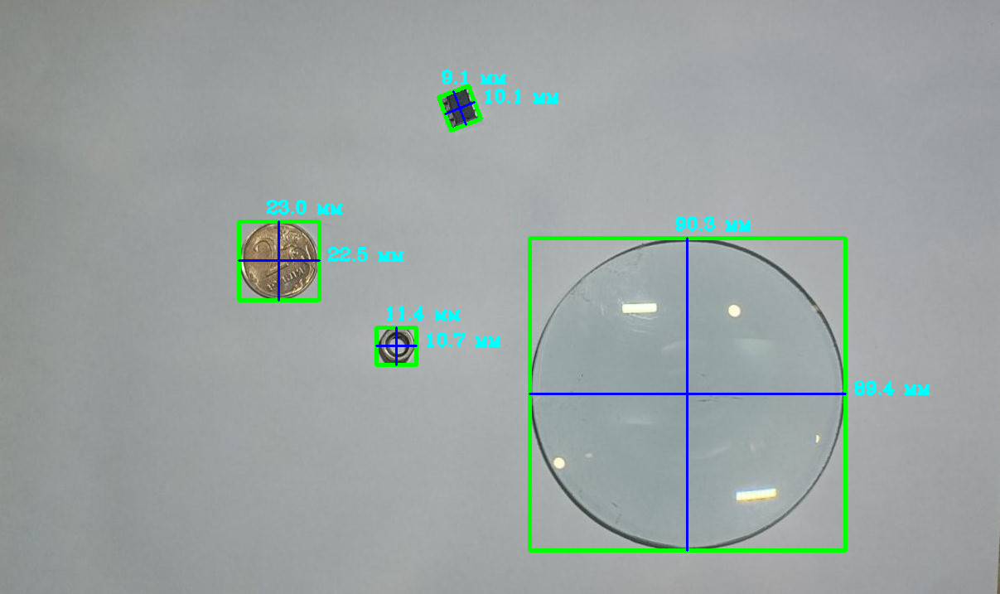

In [39]:
measureObjectDimensions(photo1, 23.0, 400, (50, 70), (1, 1), False, 1)

2. Для изображения «Фото2.jpg» эталоном является 5х-рублевая монета диаметром 25 мм. Для всех объектов на изображении попытайтесь выполнить оконтуривание прямоугольником, вычислите и подпишите ширину и высоту этих объектов.

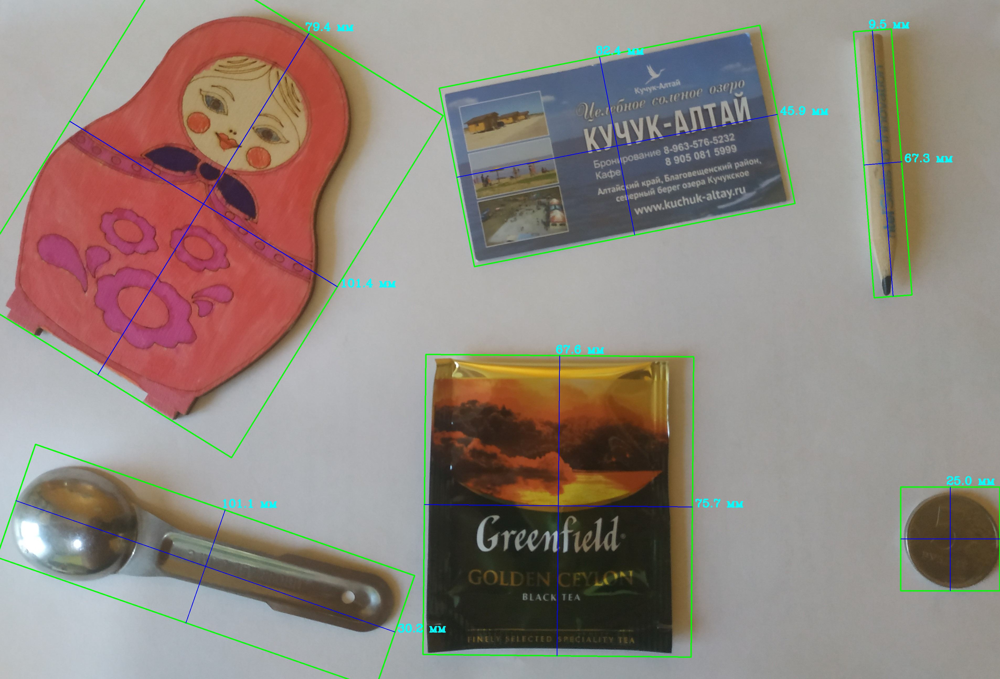

In [40]:
measureObjectDimensions(photo2, 25.0, 1000, (5, 25), (4, 4), True, 2)

3. Для изображения «Фото3.jpg» эталоном является клавиша «Esc» размером 13х9 мм. Для тачпада, также как минимум для клавиш «Пробел», «Backspace», «Caps Lock», правый и левый «Shift» наизображении выполните оконтуривание прямоугольником, вычислите и подпишите ширину и высоту этих объектов.

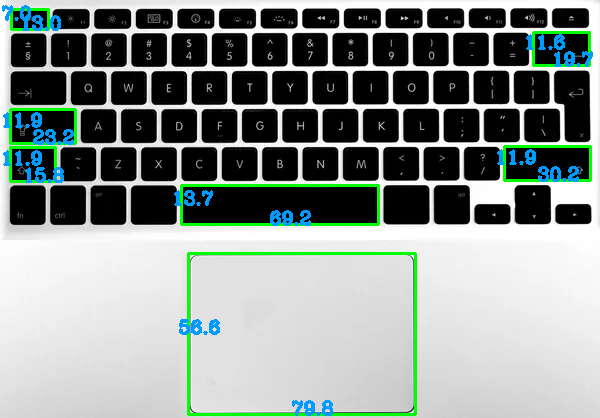

In [45]:
grayImg = cv2.cvtColor(photo3, cv2.COLOR_BGR2GRAY)
blurredImg = cv2.GaussianBlur(grayImg, (3, 3), 0)

edges = cv2.Canny(blurredImg, 60, 70)
edges = cv2.dilate(edges, None, iterations=1)
edges = cv2.erode(edges, None, iterations=1)

foundContours = cv2.findContours(
    edges,
    cv2.RETR_EXTERNAL,
    cv2.CHAIN_APPROX_SIMPLE
)
contoursList = foundContours[0] if len(foundContours) == 2 else foundContours[1]
(contoursList, _) = contours.sort_contours(contoursList)

contoursPreview = photo3.copy()
cv2.drawContours(contoursPreview, contoursList, -1, (0, 255, 0), 2)

selectedContours = []
selectedContours.append(contoursList[5])
selectedContours.append(contoursList[1])
selectedContours.append(contoursList[2])
selectedContours.append(contoursList[26])
selectedContours.append(contoursList[28])
selectedContours.append(contoursList[70])
selectedContours.append(contoursList[75])

resultImg = photo3.copy()
pixelsPerMillimeter = None
referenceWidth = 13.0
referenceHeight = 9.0

for contour in selectedContours:
    if cv2.contourArea(contour) < 500:
        continue

    rect = cv2.minAreaRect(contour)
    boxPoints = cv2.cv.BoxPoints(rect) if imutils.is_cv2() else cv2.boxPoints(rect)
    orderedBox = perspective.order_points(boxPoints)

    cv2.drawContours(
        resultImg,
        [orderedBox.astype("int")],
        -1,
        (0, 255, 0),
        2
    )

    topLeft, topRight, bottomRight, bottomLeft = orderedBox

    topMidX, topMidY = centerPos(topLeft, topRight)
    bottomMidX, bottomMidY = centerPos(bottomLeft, bottomRight)
    leftMidX, leftMidY = centerPos(topLeft, bottomLeft)
    rightMidX, rightMidY = centerPos(topRight, bottomRight)

    distanceA = dist.euclidean(
        (topMidX, topMidY),
        (bottomMidX, bottomMidY)
    )
    distanceB = dist.euclidean(
        (leftMidX, leftMidY),
        (rightMidX, rightMidY)
    )

    if pixelsPerMillimeter is None:
        pixelsPerMillimeter = distanceB / referenceWidth

    sizeA = distanceA / pixelsPerMillimeter
    sizeB = distanceB / pixelsPerMillimeter

    cv2.putText(
        resultImg,
        "{:.1f}".format(sizeB),
        (int(bottomMidX - 10), int(bottomMidY)),
        cv2.FONT_HERSHEY_COMPLEX,
        0.6,
        (255, 155, 0),
        2
    )

    cv2.putText(
        resultImg,
        "{:.1f}".format(sizeA),
        (int(leftMidX - 10), int(leftMidY)),
        cv2.FONT_HERSHEY_COMPLEX,
        0.6,
        (255, 155, 0),
        2
    )

cv2_imshow(resultImg)
